Data source : https://www.kaggle.com/grassknoted/asl-alphabet   
This notebook is to build various Neural network models for the purpose of sign language classification. Images are in RGB.    

In [ ]:
Data source : https://www.kaggle.com/grassknoted/asl-alphabet This notebook is test models with 2 layer CNN + Msx Pooling and 3 layer CNN + Max Pooling on the given test images as well as few ASL images downloaded from the net.

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report

In [2]:
image_path = "../input/asl-alphabet/asl_alphabet_train/asl_alphabet_train"
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  image_path,
  image_size=(224,224),
  batch_size=32,
validation_split=0.25,
  subset="training",
  seed=123)


val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  image_path,
  image_size=(224,224),
  batch_size=32,
validation_split=0.25,
  subset="validation",
  seed=123)

test_path = "../input/asl-alphabet/asl_alphabet_test/asl_alphabet_test"
#test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  #test_path,
  #image_size=(224,224),
  #batch_size=32)


Found 87000 files belonging to 29 classes.
Using 65250 files for training.


2021-10-13 09:34:18.470857: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-10-13 09:34:18.474420: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-10-13 09:34:18.520458: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-13 09:34:18.521082: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2021-10-13 09:34:18.521137: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-10-13 09:34:18.555598: I tensorflow/stream_executor/platform/def

Found 87000 files belonging to 29 classes.
Using 21750 files for validation.


In [3]:
import glob
import pathlib 

data_dir = pathlib.Path(image_path)
class_names = np.array(sorted([item.name for item in data_dir.glob('*') if item.name != "LICENSE.txt"]))
print(class_names)

['A' 'B' 'C' 'D' 'E' 'F' 'G' 'H' 'I' 'J' 'K' 'L' 'M' 'N' 'O' 'P' 'Q' 'R'
 'S' 'T' 'U' 'V' 'W' 'X' 'Y' 'Z' 'del' 'nothing' 'space']


In [4]:
import cv2
import os

test_class = []
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        test_class.append(filename[0])
        img = cv2.imread(os.path.join(folder,filename))
        img = cv2.resize(img , (224,224))
        if img is not None:
            images.append(img)
    return images

pred_images = load_images_from_folder(test_path)
test_class

['A',
 'E',
 'L',
 'N',
 'S',
 'D',
 'G',
 'I',
 'W',
 'M',
 'n',
 'X',
 'H',
 'Q',
 'C',
 'T',
 'P',
 'V',
 'Y',
 'U',
 's',
 'O',
 'B',
 'R',
 'F',
 'Z',
 'J',
 'K']

In [5]:
type(pred_images)

list

In [6]:
pred_images = np.array(pred_images)
pred_images.shape

(28, 224, 224, 3)

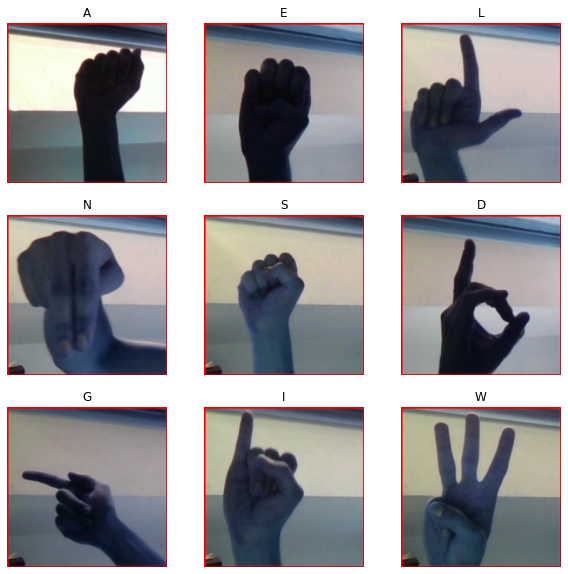

In [7]:
## visualize prediction images 
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(pred_images[i])
    plt.title(test_class[i])
    plt.axis("off")

2021-10-13 09:34:50.581007: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2021-10-13 09:34:50.584643: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2000150000 Hz


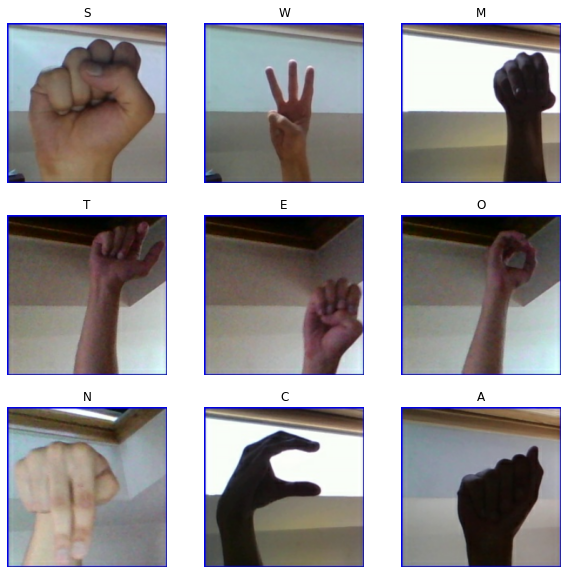

In [8]:
## visualize train set images
image_batch, label_batch = next(iter(train_ds))
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    label = label_batch[i]
    name = class_names[label]
    plt.title(name)
    plt.axis("off")

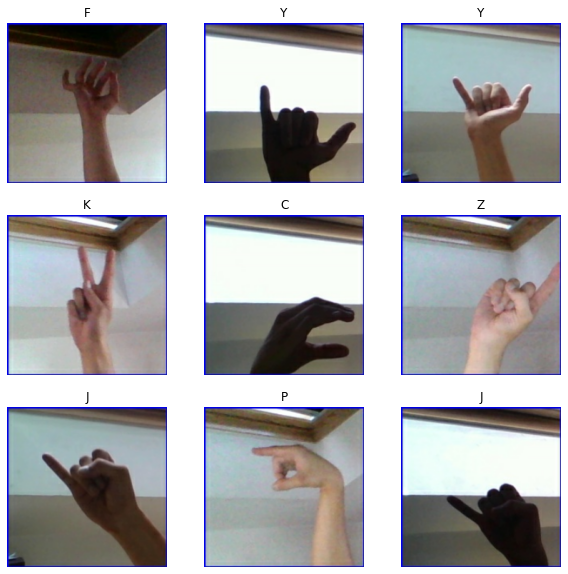

In [9]:
## visualize validation images 
image_batch, label_batch = next(iter(val_ds))
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    label = label_batch[i]
    name = class_names[label]
    plt.title(name)
    plt.axis("off")

Epoch 1/10
2040/2040 [==============================] - 203s 99ms/step - loss: 487.3246 - accuracy: 0.0334 - val_loss: 3.3677 - val_accuracy: 0.0327
Epoch 2/10
2040/2040 [==============================] - 203s 99ms/step - loss: 3.3676 - accuracy: 0.0330 - val_loss: 3.3677 - val_accuracy: 0.0327
Epoch 3/10
2040/2040 [==============================] - 201s 99ms/step - loss: 3.3676 - accuracy: 0.0320 - val_loss: 3.3677 - val_accuracy: 0.0327
Epoch 4/10
2040/2040 [==============================] - 200s 98ms/step - loss: 3.3677 - accuracy: 0.0324 - val_loss: 3.3678 - val_accuracy: 0.0327
Epoch 5/10
2040/2040 [==============================] - 201s 98ms/step - loss: 3.3677 - accuracy: 0.0326 - val_loss: 3.3677 - val_accuracy: 0.0327
Epoch 6/10
2040/2040 [==============================] - 201s 98ms/step - loss: 3.3676 - accuracy: 0.0323 - val_loss: 3.3678 - val_accuracy: 0.0327
Epoch 7/10
2040/2040 [==============================] - 201s 98ms/step - loss: 3.3677 - accuracy: 0.0326 - val_loss:

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


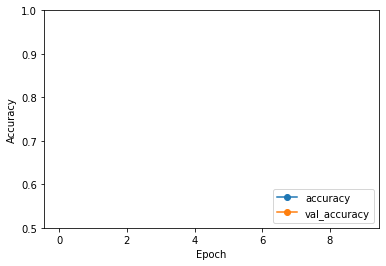

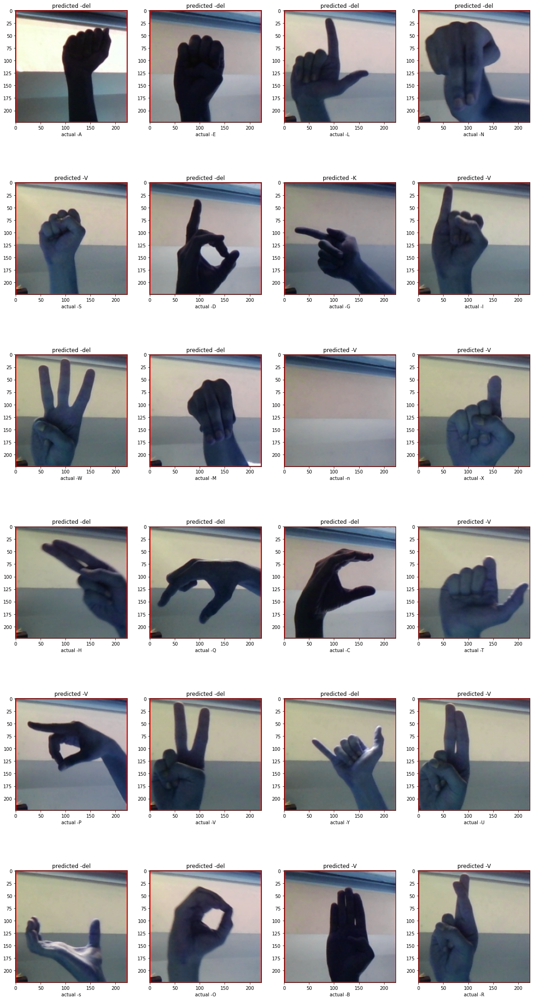

In [14]:
## single layer CNN 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),      
  tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(29, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_ds, epochs=10, validation_data = val_ds)
##
test_loss, test_acc = model.evaluate(val_ds)
print("Validation image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn1')
##

## for validation data set , check the classification report.
val_pred = np.array([])
val_labels = np.array([])
for x, y in val_ds:
    predictions =  np.argmax(model.predict(x), axis = -1)
    val_pred = np.concatenate([val_pred,np.array(predictions)])
    val_labels = np.concatenate([val_labels , y.numpy()])
    
##
print('Classification Report')
target_names = class_names
print(classification_report(val_labels, val_pred, target_names=class_names))
##
print(model.summary())
##
predicted_labels = model.predict(pred_images)
pred_labels = np.argmax(predicted_labels, axis = -1)
##
## visualize prediction images with the prediction 
plt.figure(figsize=(20, 40))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])

As shown above, the single CNN layer model performs very poorly in the task of classification.  

Epoch 1/10
2040/2040 [==============================] - 202s 99ms/step - loss: 20.9897 - accuracy: 0.4931 - val_loss: 0.3438 - val_accuracy: 0.8824
Epoch 2/10
2040/2040 [==============================] - 203s 99ms/step - loss: 0.3449 - accuracy: 0.8808 - val_loss: 0.2942 - val_accuracy: 0.9068
Epoch 3/10
2040/2040 [==============================] - 201s 98ms/step - loss: 0.2197 - accuracy: 0.9256 - val_loss: 0.6911 - val_accuracy: 0.8109
Epoch 4/10
2040/2040 [==============================] - 203s 100ms/step - loss: 0.1930 - accuracy: 0.9356 - val_loss: 0.3440 - val_accuracy: 0.9108
Epoch 5/10
2040/2040 [==============================] - 202s 99ms/step - loss: 0.1726 - accuracy: 0.9463 - val_loss: 0.2984 - val_accuracy: 0.9237
Epoch 6/10
2040/2040 [==============================] - 202s 99ms/step - loss: 0.1370 - accuracy: 0.9571 - val_loss: 0.4004 - val_accuracy: 0.9127
Epoch 7/10
2040/2040 [==============================] - 202s 99ms/step - loss: 0.1499 - accuracy: 0.9555 - val_loss:

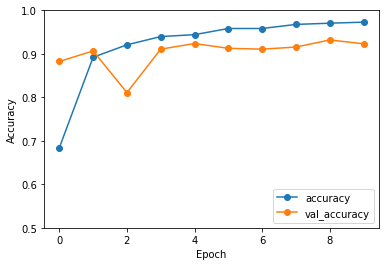

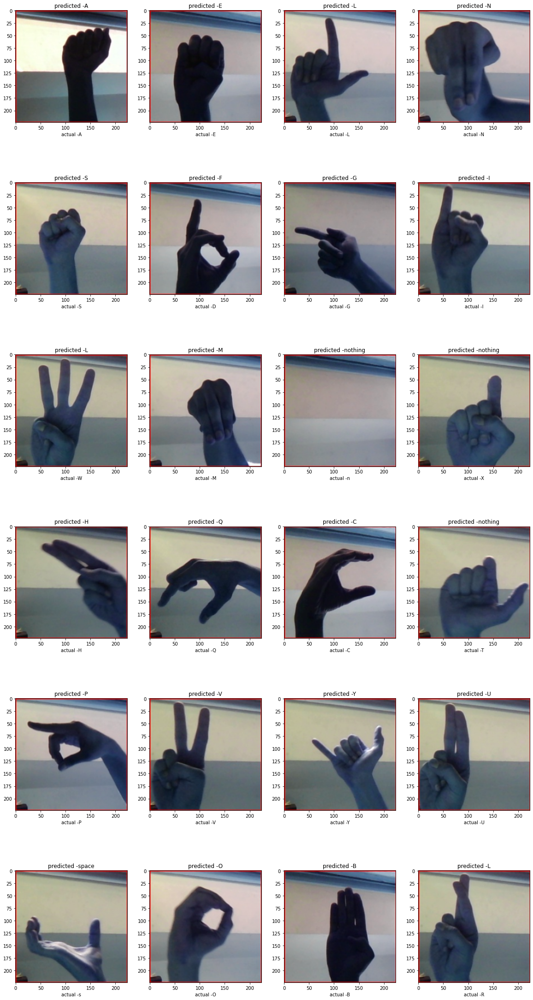

In [12]:
## two layer CNN 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)), 
     tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
  tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(29, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_ds, epochs=10, validation_data = val_ds)
##
test_loss, test_acc = model.evaluate(val_ds)
print("Test image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn2')
## for validation data set , check the classification report.
val_pred = np.array([])
val_labels = np.array([])
for x, y in val_ds:
    predictions =  np.argmax(model.predict(x), axis = -1)
    val_pred = np.concatenate([val_pred,np.array(predictions)])
    val_labels = np.concatenate([val_labels , y.numpy()])
    
##
print('Classification Report')
target_names = class_names
print(classification_report(val_labels, val_pred, target_names=class_names))
##
print(model.summary())
##
predicted_labels = model.predict(pred_images)
pred_labels = np.argmax(predicted_labels, axis = -1)
##
## visualize prediction images with the prediction 
plt.figure(figsize=(20, 40))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])

The two layer CNN model performs better than the single layer with 5 test images marked incorrectly and accuracy rate of 0.8

Epoch 1/10


2021-10-13 09:36:02.058725: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2021-10-13 09:36:02.911214: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2021-10-13 09:36:02.938393: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8


2040/2040 [==============================] - 573s 278ms/step - loss: 5.1117 - accuracy: 0.2939 - val_loss: 0.5876 - val_accuracy: 0.7975
Epoch 2/10
2040/2040 [==============================] - 199s 98ms/step - loss: 0.4317 - accuracy: 0.8531 - val_loss: 0.3529 - val_accuracy: 0.8870
Epoch 3/10
2040/2040 [==============================] - 201s 98ms/step - loss: 0.2381 - accuracy: 0.9189 - val_loss: 0.2226 - val_accuracy: 0.9244
Epoch 4/10
2040/2040 [==============================] - 200s 98ms/step - loss: 0.1777 - accuracy: 0.9417 - val_loss: 0.1397 - val_accuracy: 0.9551
Epoch 5/10
2040/2040 [==============================] - 202s 99ms/step - loss: 0.1112 - accuracy: 0.9632 - val_loss: 0.1946 - val_accuracy: 0.9433
Epoch 6/10
2040/2040 [==============================] - 244s 119ms/step - loss: 0.0886 - accuracy: 0.9718 - val_loss: 0.1961 - val_accuracy: 0.9429
Epoch 7/10
2040/2040 [==============================] - 276s 135ms/step - loss: 0.0872 - accuracy: 0.9734 - val_loss: 0.1165 - 

2021-10-13 10:18:27.600716: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


Classification Report
              precision    recall  f1-score   support

           A       0.93      0.99      0.96       774
           B       0.95      0.97      0.96       759
           C       1.00      0.96      0.98       739
           D       0.99      0.96      0.98       766
           E       0.99      0.93      0.96       745
           F       0.99      1.00      0.99       745
           G       0.94      0.99      0.96       760
           H       0.97      0.96      0.96       743
           I       0.98      0.97      0.98       757
           J       1.00      0.96      0.98       719
           K       0.96      0.99      0.98       712
           L       1.00      0.95      0.97       748
           M       0.96      0.92      0.94       756
           N       0.92      0.98      0.95       765
           O       0.98      0.86      0.92       762
           P       0.97      0.98      0.98       741
           Q       0.98      0.97      0.98       758
     

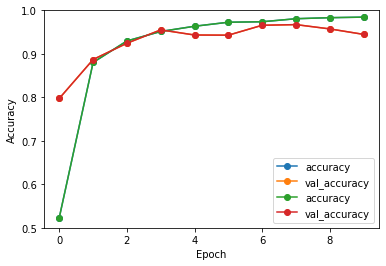

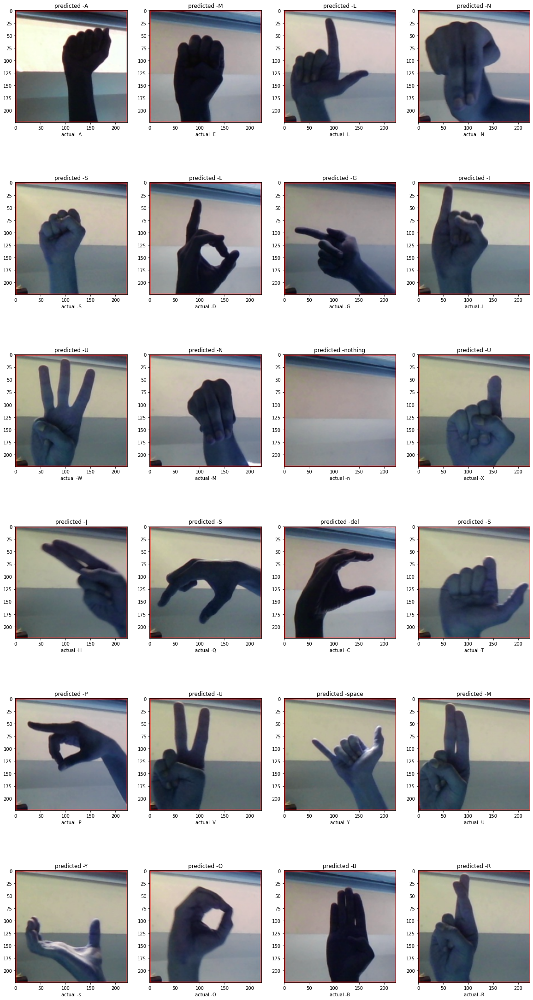

In [10]:
## three layer CNN 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)), 
     tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(29, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_ds, epochs=10, validation_data = val_ds)
##
test_loss, test_acc = model.evaluate(val_ds)
print("Validation image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn3')
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn3')
##
## for validation data set , check the classification report.
val_pred = np.array([])
val_labels = np.array([])
for x, y in val_ds:
    predictions =  np.argmax(model.predict(x), axis = -1)
    val_pred = np.concatenate([val_pred,np.array(predictions)])
    val_labels = np.concatenate([val_labels , y.numpy()])
    
##
print('Classification Report')
target_names = class_names
print(classification_report(val_labels, val_pred, target_names=class_names))
##
print(model.summary())
##
predicted_labels = model.predict(pred_images)
pred_labels = np.argmax(predicted_labels, axis = -1)
##
## visualize prediction images with the prediction 
plt.figure(figsize=(20, 40))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])
    

The three layer CNN model has accuracy less than  @50% on test set images as 13 images are marked incorrectly.  

Epoch 1/10
2040/2040 [==============================] - 203s 99ms/step - loss: 4.7686 - accuracy: 0.4748 - val_loss: 0.2506 - val_accuracy: 0.9109
Epoch 2/10
2040/2040 [==============================] - 200s 98ms/step - loss: 0.2637 - accuracy: 0.9116 - val_loss: 0.3330 - val_accuracy: 0.8967
Epoch 3/10
2040/2040 [==============================] - 200s 98ms/step - loss: 0.1887 - accuracy: 0.9401 - val_loss: 0.1149 - val_accuracy: 0.9634
Epoch 4/10
2040/2040 [==============================] - 198s 97ms/step - loss: 0.1239 - accuracy: 0.9613 - val_loss: 0.0712 - val_accuracy: 0.9787
Epoch 5/10
2040/2040 [==============================] - 199s 97ms/step - loss: 0.0932 - accuracy: 0.9717 - val_loss: 0.2011 - val_accuracy: 0.9468
Epoch 6/10
2040/2040 [==============================] - 199s 98ms/step - loss: 0.0843 - accuracy: 0.9749 - val_loss: 0.0837 - val_accuracy: 0.9769
Epoch 7/10
2040/2040 [==============================] - 200s 98ms/step - loss: 0.0799 - accuracy: 0.9766 - val_loss: 0

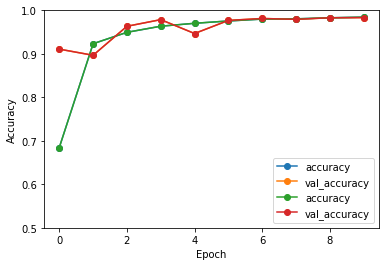

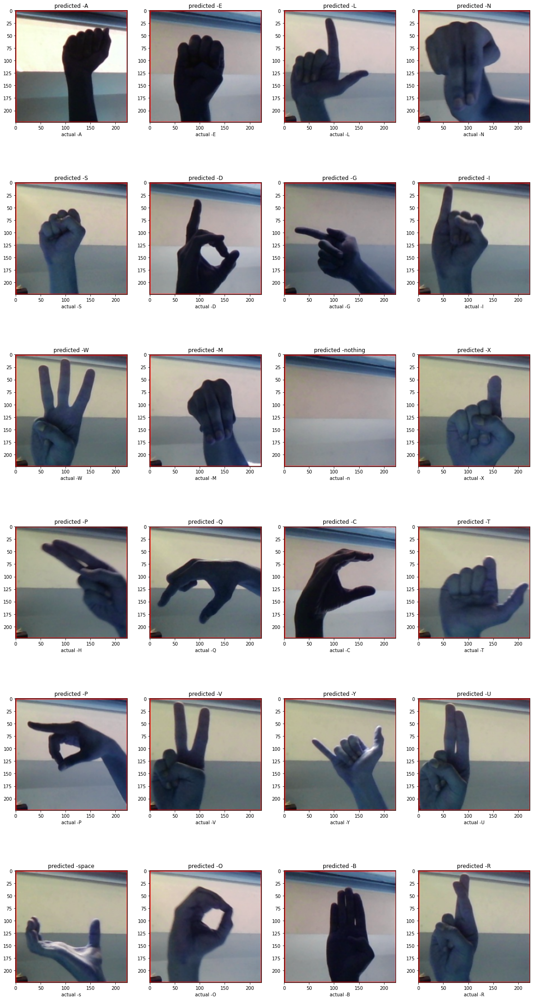

In [11]:
## three layer CNN with dropout 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)), 
    tf.keras.layers.Dropout(0.2),
     tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(29, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_ds, epochs=10, validation_data = val_ds)
##
test_loss, test_acc = model.evaluate(val_ds)
print("Validation image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn3')
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn3_dp')
##
## for validation data set , check the classification report.
val_pred = np.array([])
val_labels = np.array([])
for x, y in val_ds:
    predictions =  np.argmax(model.predict(x), axis = -1)
    val_pred = np.concatenate([val_pred,np.array(predictions)])
    val_labels = np.concatenate([val_labels , y.numpy()])
    
##
print('Classification Report')
target_names = class_names
print(classification_report(val_labels, val_pred, target_names=class_names))
##
print(model.summary())
##
predicted_labels = model.predict(pred_images)
pred_labels = np.argmax(predicted_labels, axis = -1)
##
## visualize prediction images with the prediction 
plt.figure(figsize=(20, 40))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])
    

Three layer CNN with dropout has performed better as the test set accuracy improved to 0.99 , marking only ine image incorrectly.  

Epoch 1/10


2021-10-11 13:53:29.846832: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2021-10-11 13:53:30.628463: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2021-10-11 13:53:30.656525: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8


2040/2040 [==============================] - 519s 251ms/step - loss: 13.9624 - accuracy: 0.5948 - val_loss: 0.2060 - val_accuracy: 0.9303
Epoch 2/10
2040/2040 [==============================] - 148s 73ms/step - loss: 0.1728 - accuracy: 0.9418 - val_loss: 0.1786 - val_accuracy: 0.9408
Epoch 3/10
2040/2040 [==============================] - 147s 72ms/step - loss: 0.1262 - accuracy: 0.9576 - val_loss: 0.2076 - val_accuracy: 0.9439
Epoch 4/10
2040/2040 [==============================] - 148s 72ms/step - loss: 0.1094 - accuracy: 0.9653 - val_loss: 0.1958 - val_accuracy: 0.9451
Epoch 5/10
2040/2040 [==============================] - 148s 72ms/step - loss: 0.0771 - accuracy: 0.9769 - val_loss: 0.1558 - val_accuracy: 0.9597
Epoch 6/10
2040/2040 [==============================] - 149s 73ms/step - loss: 0.0819 - accuracy: 0.9763 - val_loss: 0.0984 - val_accuracy: 0.9715
Epoch 7/10
2040/2040 [==============================] - 148s 72ms/step - loss: 0.0599 - accuracy: 0.9831 - val_loss: 0.1858 - v

2021-10-11 14:25:02.773339: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


Classification Report
              precision    recall  f1-score   support

           A       0.99      0.97      0.98       774
           B       0.97      1.00      0.98       759
           C       0.99      1.00      0.99       739
           D       0.99      0.98      0.98       766
           E       0.97      0.97      0.97       745
           F       0.99      0.98      0.99       745
           G       0.96      1.00      0.98       760
           H       1.00      0.97      0.99       743
           I       0.99      0.99      0.99       757
           J       1.00      0.99      1.00       719
           K       0.97      0.98      0.97       712
           L       0.99      0.98      0.99       748
           M       0.97      0.98      0.98       756
           N       0.99      0.98      0.98       765
           O       0.99      0.98      0.99       762
           P       0.99      0.99      0.99       741
           Q       1.00      0.98      0.99       758
     

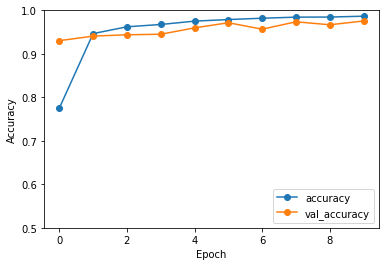

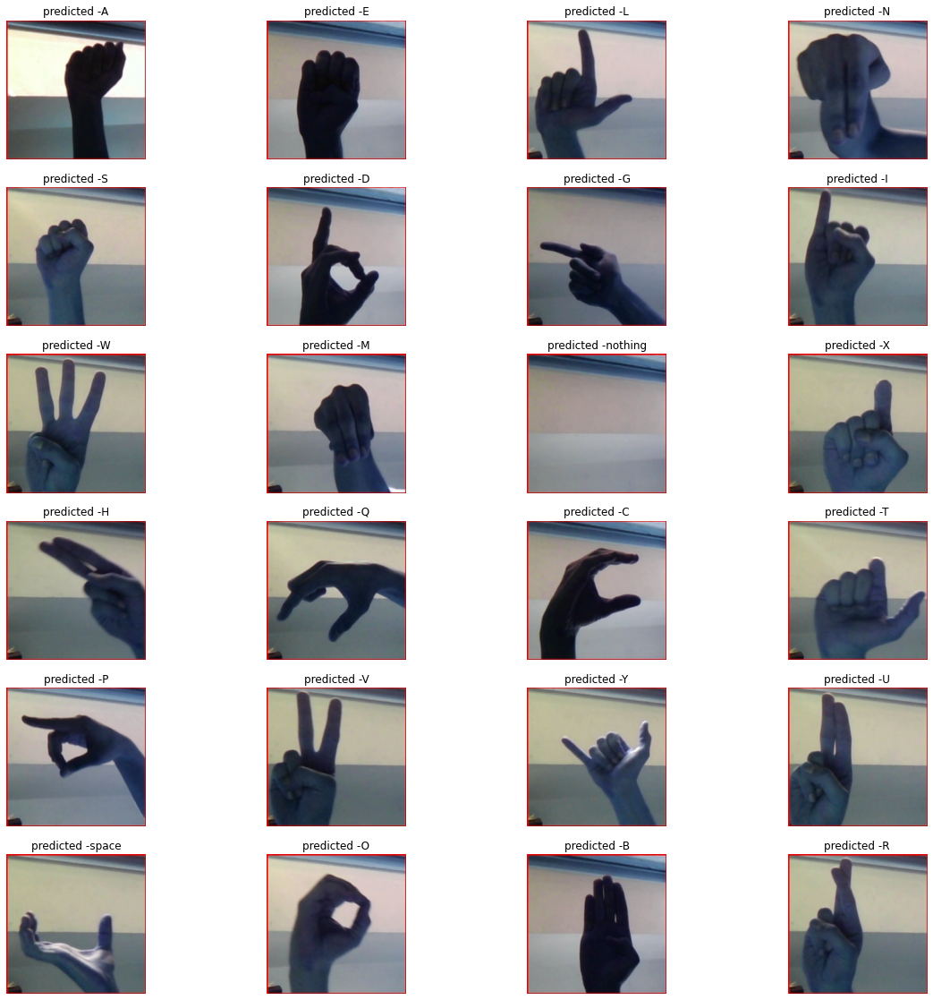

In [13]:
## three layer CNN with lesser filters 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 8, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 16, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 32, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)), 
     tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(29, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_ds, epochs=10, validation_data = val_ds)
##
test_loss, test_acc = model.evaluate(val_ds)
print("Validation image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn3')
#
## for validation data set , check the classification report.
val_pred = np.array([])
val_labels = np.array([])
for x, y in val_ds:
    predictions =  np.argmax(model.predict(x), axis = -1)
    val_pred = np.concatenate([val_pred,np.array(predictions)])
    val_labels = np.concatenate([val_labels , y.numpy()])
    
##
print('Classification Report')
target_names = class_names
print(classification_report(val_labels, val_pred, target_names=class_names))
##
print(model.summary())
##
predicted_labels = model.predict(pred_images)
pred_labels = np.argmax(predicted_labels, axis = -1)
##
## visualize prediction images with the prediction 
plt.figure(figsize=(20, 20))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])
    plt.axis("off")

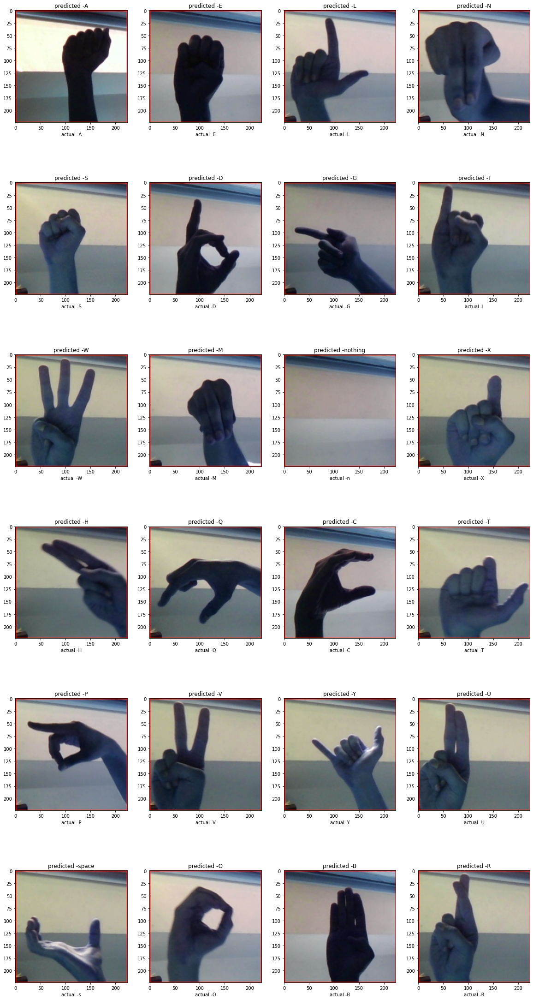

In [18]:
# visualize test images with the predicted classes 
plt.figure(figsize=(20, 40))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])
    #plt.axis("off")

The three layer CNN model with filters 8,16 and 32 has predicted all the test images correctly.  

Epoch 1/10
2040/2040 [==============================] - 152s 74ms/step - loss: 4.0569 - accuracy: 0.5275 - val_loss: 0.2916 - val_accuracy: 0.8918
Epoch 2/10
2040/2040 [==============================] - 187s 92ms/step - loss: 0.2178 - accuracy: 0.9282 - val_loss: 0.1904 - val_accuracy: 0.9383
Epoch 3/10
2040/2040 [==============================] - 148s 72ms/step - loss: 0.1325 - accuracy: 0.9571 - val_loss: 0.2734 - val_accuracy: 0.9195
Epoch 4/10
2040/2040 [==============================] - 150s 74ms/step - loss: 0.1027 - accuracy: 0.9665 - val_loss: 0.1587 - val_accuracy: 0.9484
Epoch 5/10
2040/2040 [==============================] - 147s 72ms/step - loss: 0.1037 - accuracy: 0.9686 - val_loss: 0.1189 - val_accuracy: 0.9635
Epoch 6/10
2040/2040 [==============================] - 148s 72ms/step - loss: 0.0755 - accuracy: 0.9768 - val_loss: 0.1197 - val_accuracy: 0.9645
Epoch 7/10
2040/2040 [==============================] - 147s 72ms/step - loss: 0.0608 - accuracy: 0.9816 - val_loss: 0

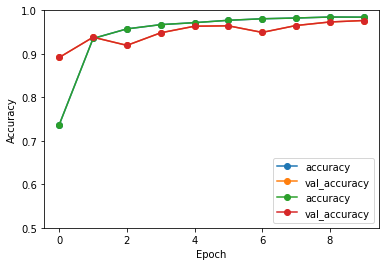

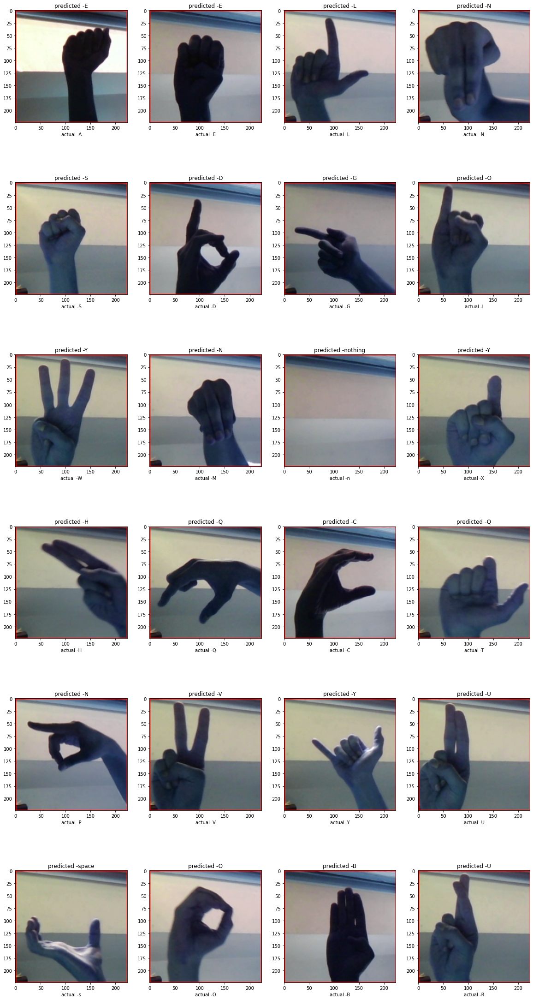

In [19]:
## three layer CNN with even lesser filters 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 8, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 8, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 8, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)), 
     tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(29, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_ds, epochs=10, validation_data = val_ds)
##
test_loss, test_acc = model.evaluate(val_ds)
print("Validation image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn3')
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn3')
##
## for validation data set , check the classification report.
val_pred = np.array([])
val_labels = np.array([])
for x, y in val_ds:
    predictions =  np.argmax(model.predict(x), axis = -1)
    val_pred = np.concatenate([val_pred,np.array(predictions)])
    val_labels = np.concatenate([val_labels , y.numpy()])
    
##
print('Classification Report')
target_names = class_names
print(classification_report(val_labels, val_pred, target_names=class_names))
##
print(model.summary())
##
predicted_labels = model.predict(pred_images)
pred_labels = np.argmax(predicted_labels, axis = -1)
##
## visualize prediction images with the prediction 
plt.figure(figsize=(20, 40))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])


Three layer CNN Model with even lesser filters has reduced the test set accuracy to 67% by identifying 8 images inaccurately.    

Epoch 1/10
2040/2040 [==============================] - 200s 98ms/step - loss: 2.0558 - accuracy: 0.5686 - val_loss: 0.1463 - val_accuracy: 0.9507
Epoch 2/10
2040/2040 [==============================] - 201s 98ms/step - loss: 0.1426 - accuracy: 0.9539 - val_loss: 0.1229 - val_accuracy: 0.9606
Epoch 3/10
2040/2040 [==============================] - 200s 98ms/step - loss: 0.0832 - accuracy: 0.9740 - val_loss: 0.0710 - val_accuracy: 0.9769
Epoch 4/10
2040/2040 [==============================] - 227s 111ms/step - loss: 0.0534 - accuracy: 0.9832 - val_loss: 0.1502 - val_accuracy: 0.9540
Epoch 5/10
2040/2040 [==============================] - 244s 119ms/step - loss: 0.0585 - accuracy: 0.9823 - val_loss: 0.0613 - val_accuracy: 0.9830
Epoch 6/10
2040/2040 [==============================] - 258s 126ms/step - loss: 0.0475 - accuracy: 0.9864 - val_loss: 0.0471 - val_accuracy: 0.9864
Epoch 7/10
2040/2040 [==============================] - 268s 131ms/step - loss: 0.0345 - accuracy: 0.9897 - val_los

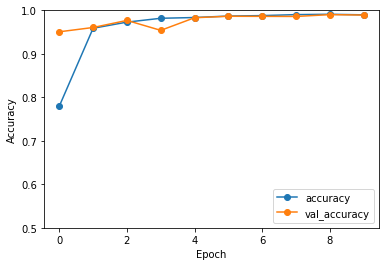

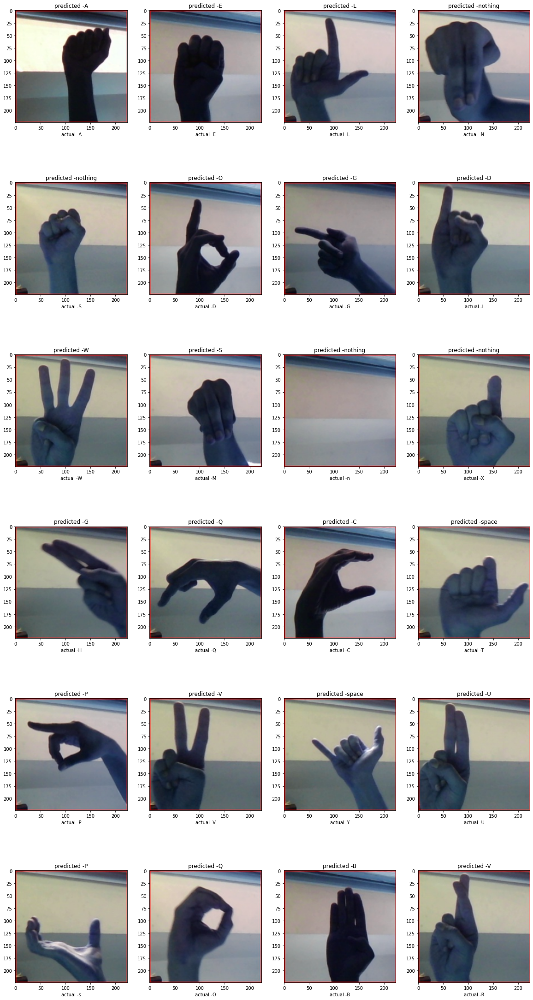

In [20]:
## four layer CNN 

##
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),   
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)), 
    tf.keras.layers.Conv2D( activation='relu', input_shape=(224, 224, 3), filters = 64, kernel_size = 3),
    tf.keras.layers.MaxPooling2D(pool_size = (2,2), strides = (2, 2)),  
tf.keras.layers.Flatten(),
tf.keras.layers.Dense(128, activation=tf.nn.relu),
tf.keras.layers.Dense(29, activation=tf.nn.softmax)])


model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'], )
%time history = model.fit(train_ds, epochs=10, validation_data = val_ds)
##
test_loss, test_acc = model.evaluate(val_ds)
print("Test image accuracy :{}".format(test_acc))
##
plt.plot(history.history['accuracy'], '-o' ,label='accuracy')
plt.plot(history.history['val_accuracy'], '-o', label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')
##
model.save('model_cnn4')
##

val_pred = np.array([])
val_labels = np.array([])
for x, y in val_ds:
    predictions =  np.argmax(model.predict(x), axis = -1)
    val_pred = np.concatenate([val_pred,np.array(predictions)])
    val_labels = np.concatenate([val_labels , y.numpy()])
    
##
print('Classification Report')
target_names = class_names
print(classification_report(val_labels, val_pred, target_names=class_names))
##
print(model.summary())
##
predicted_labels = model.predict(pred_images)
pred_labels = np.argmax(predicted_labels, axis = -1)
##
## visualize prediction images with the prediction 
plt.figure(figsize=(20, 40))
for i in range(24):
    ax = plt.subplot(6, 4, i + 1)
    plt.imshow(pred_images[i])
    plt.title("predicted -" + class_names[pred_labels[i]])
    plt.xlabel("actual -" + test_class[i])

4 CNN layers model though gives a high validation accuracy of 0.99 ,  gives a test set accuracy of 50%. 10 out of the 24  are predicted incorrectly.  

Best model so far -  
Neural Network of 3 layer CNN + MaxPooling layers with filters 8, 16 and 32.  

Next step :  
Test the above model for bias and variance when three different folds of train and validation images are trained on the NN and tested against the test images.    